In [1]:
!pip install pycocotools tensorflow opencv-python matplotlib scipy numpy -q

## COCO Dataset

In [2]:
# Import required libraries
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import requests
from zipfile import ZipFile
from tqdm import tqdm
from pycocotools.coco import COCO

# URLs for COCO dataset
coco_annotation_train_path = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
coco_annotation_val_path = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
coco_train_images_path = 'http://images.cocodataset.org/zips/train2017.zip'
coco_val_images_path = 'http://images.cocodataset.org/zips/val2017.zip'

# Function to download and unzip datasets
def download_and_unzip(url, extract_to='.'):
    local_filename = url.split('/')[-1]

    # Download with progress bar
    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 Kibibyte
    t = tqdm(total=total_size, unit='iB', unit_scale=True, desc=local_filename)

    with open(local_filename, 'wb') as f:
        for data in response.iter_content(block_size):
            t.update(len(data))
            f.write(data)
    t.close()

    # Check if the download completed
    if total_size != 0 and t.n != total_size:
        print("ERROR, something went wrong")

    # Unzip with progress bar
    with ZipFile(local_filename, 'r') as zip_ref:
        total_files = len(zip_ref.infolist())
        with tqdm(total=total_files, desc=f'Extracting {local_filename}') as pbar:
            for file in zip_ref.infolist():
                zip_ref.extract(file, extract_to)
                pbar.update(1)

    os.remove(local_filename)

# Download and unzip annotations and images
download_and_unzip(coco_annotation_train_path, './coco')
download_and_unzip(coco_train_images_path, './coco')
download_and_unzip(coco_val_images_path, './coco')

# COCO annotations
coco_train = COCO('./coco/annotations/person_keypoints_train2017.json')
coco_val = COCO('./coco/annotations/person_keypoints_val2017.json')

# Now coco_train and coco_val are ready to use


annotations_trainval2017.zip: 100%|██████████| 253M/253M [00:14<00:00, 17.0MiB/s]
Extracting annotations_trainval2017.zip: 100%|██████████| 6/6 [00:18<00:00,  3.09s/it]
train2017.zip: 100%|██████████| 19.3G/19.3G [06:48<00:00, 47.3MiB/s]
Extracting train2017.zip: 100%|██████████| 118288/118288 [02:51<00:00, 688.07it/s]
val2017.zip: 100%|██████████| 816M/816M [00:15<00:00, 52.9MiB/s]
Extracting val2017.zip: 100%|██████████| 5001/5001 [00:03<00:00, 1643.33it/s]


loading annotations into memory...
Done (t=9.48s)
creating index...
index created!
loading annotations into memory...
Done (t=0.30s)
creating index...
index created!


## PROJECT PROPOSAL AND PRELIMINARY ANALYSIS

In [ ]:
import cv2

# extracting all image IDs that contain human pose annotations
cat_ids = coco.getCatIds(catNms=['person'])
img_ids = coco.getImgIds(catIds=cat_ids)

# load and visualize keypoints from dataset
def visualize_keypoints(image_id):
    # image info
    img_info = coco.loadImgs(image_id)[0]
    image_path = f'./coco/train2017/{img_info["file_name"]}'

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=img_info['id'], iscrowd=False)
    anns = coco.loadAnns(ann_ids)

    plt.imshow(image)
    plt.axis('off')

    for ann in anns:
        keypoints = np.array(ann['keypoints']).reshape(-1, 3)
        for point in keypoints:
            if point[2] > 0:  # if the keypoint is visible
                plt.plot(point[0], point[1], 'ro')

    plt.show()

In [ ]:
# Function to load and display an image without keypoints
def display_image(image_id):
    img_info = coco.loadImgs(image_id)[0]
    image_path = f'./coco/train2017/{img_info["file_name"]}'
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [ ]:
import random
# randomly select 5 image IDs
random_img_ids = random.sample(img_ids, 5)

### Images WITHOUT Keypoints

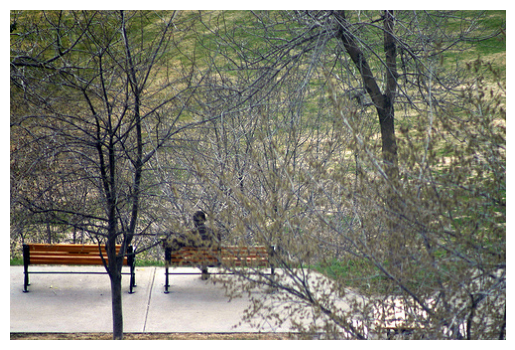

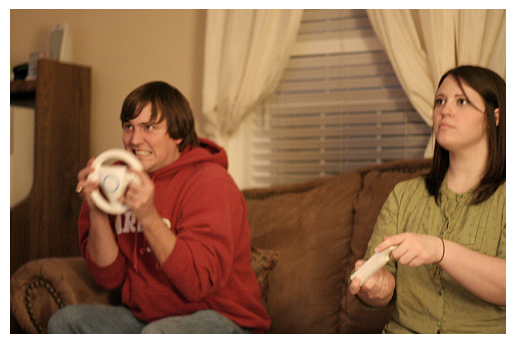

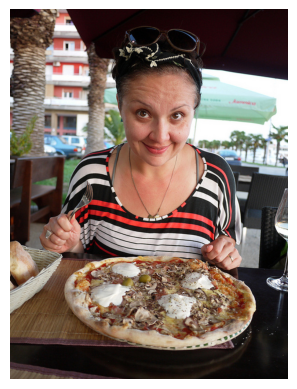

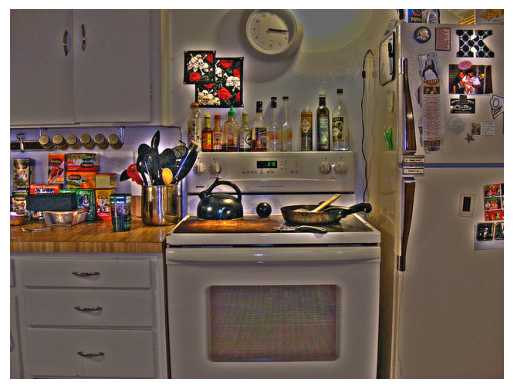

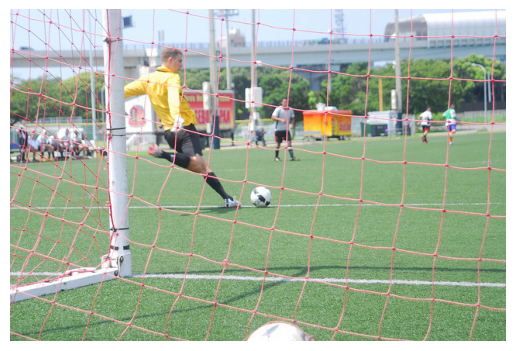

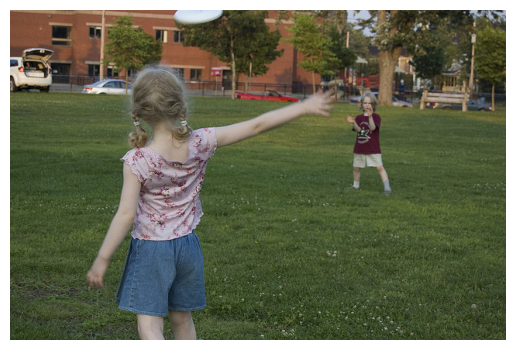

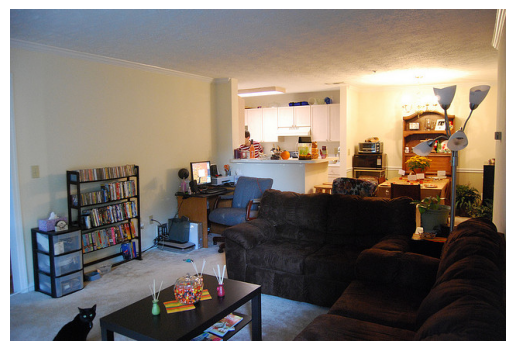

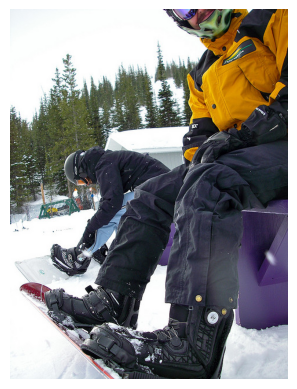

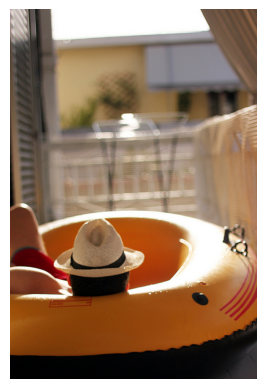

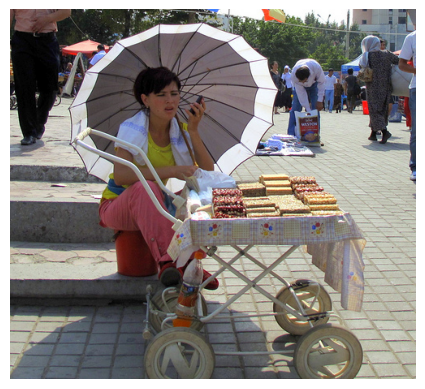

In [ ]:
# Display the selected random images without keypoints
for img_id in random_img_ids:
    display_image(img_id)

### Images WITH Keypoints

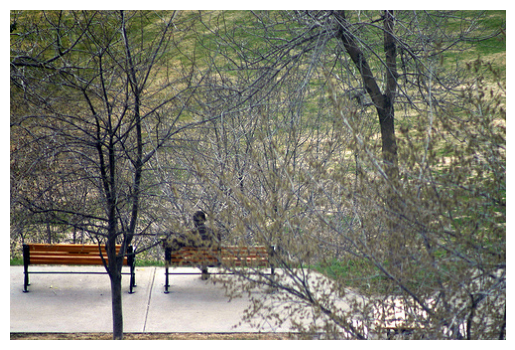

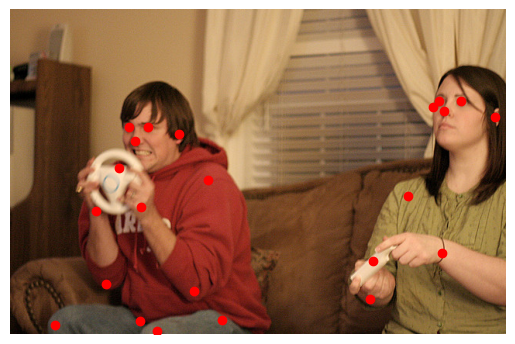

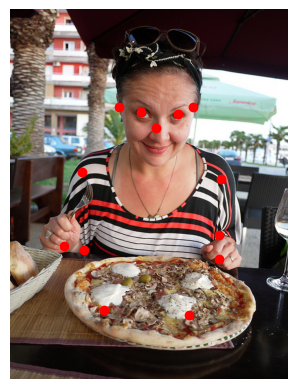

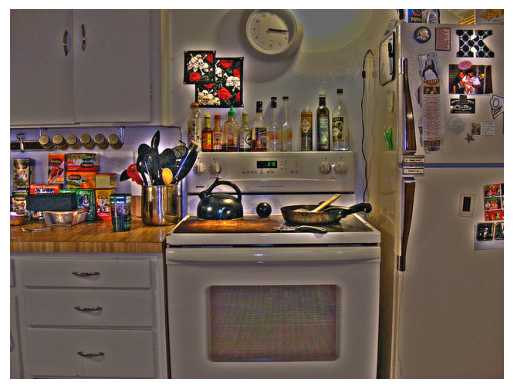

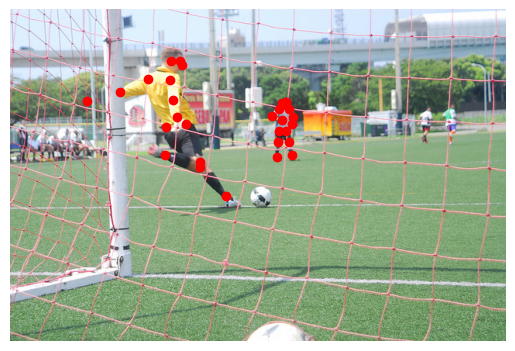

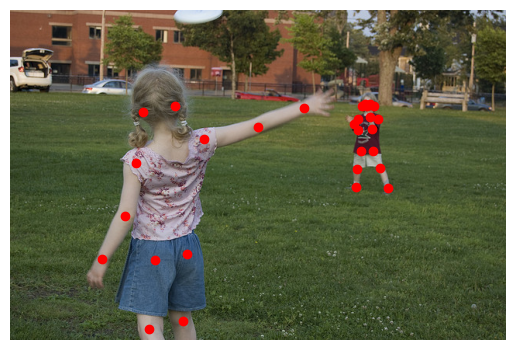

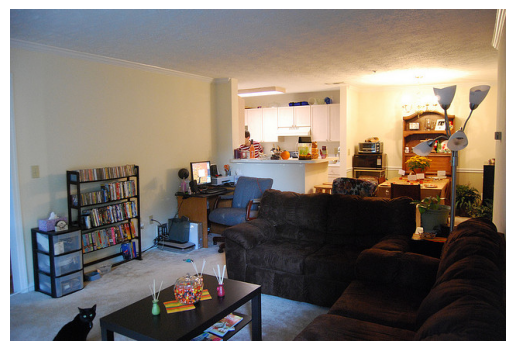

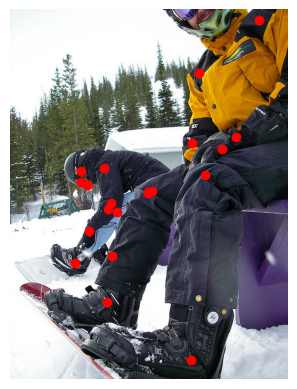

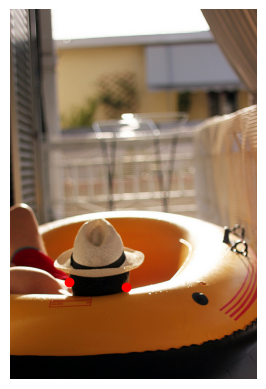

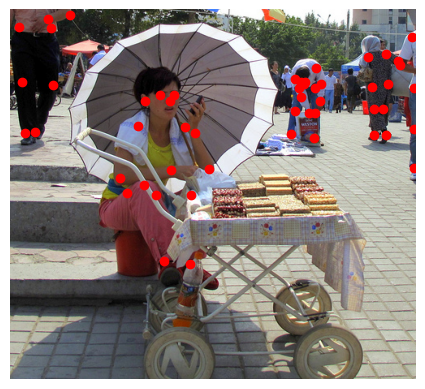

In [ ]:
# visualize the selected random images with keypoints
for img_id in random_img_ids:
    visualize_keypoints(img_id)

### Some Basic Analysis of COCO Dataset

In [ ]:
import numpy as np

# Number of images
num_images = len(img_ids)
print(f"Number of images: {num_images}")

# Number of annotations
num_annotations = len(coco.getAnnIds())
print(f"Number of annotations: {num_annotations}")

# Distribution of keypoints
keypoints = []
for ann_id in coco.getAnnIds():
    ann = coco.loadAnns(ann_id)[0]
    keypoints.append(np.array(ann['keypoints']).reshape(-1, 3))

keypoints = np.concatenate(keypoints, axis=0)
visible_keypoints = keypoints[keypoints[:, 2] > 0]
print(f"Distribution of keypoints: {np.mean(visible_keypoints, axis=0)}")


Number of images: 64115
Number of annotations: 262465
Distribution of keypoints: [292.36960195 231.39894403   1.8870828 ]


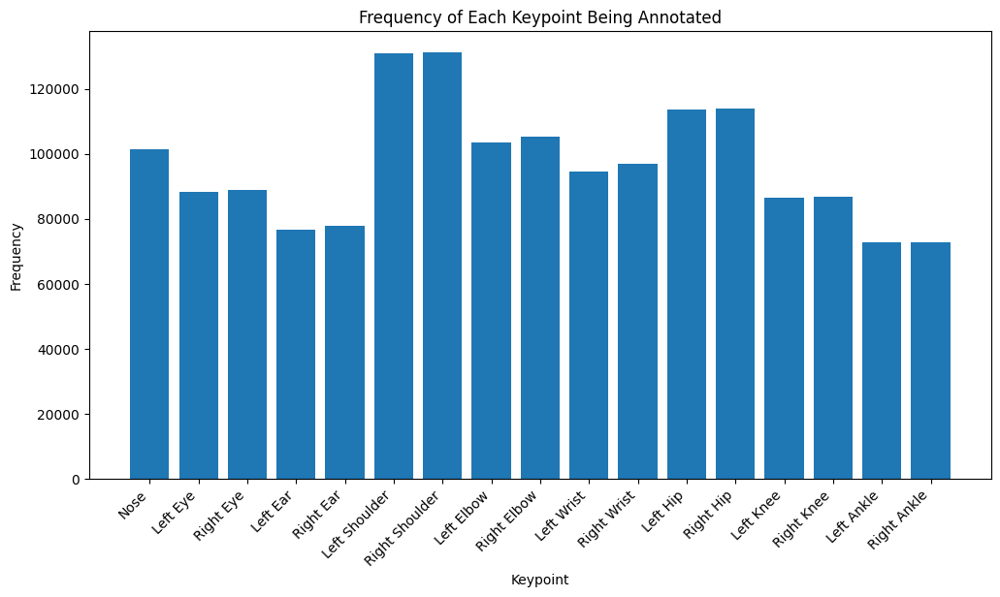

In [ ]:
keypoint_labels = [
    'Nose', 'Left Eye', 'Right Eye', 'Left Ear', 'Right Ear',
    'Left Shoulder', 'Right Shoulder', 'Left Elbow', 'Right Elbow',
    'Left Wrist', 'Right Wrist', 'Left Hip', 'Right Hip',
    'Left Knee', 'Right Knee', 'Left Ankle', 'Right Ankle'
]

keypoint_counts = np.sum(keypoints[:, 2].reshape(-1, 17) > 0, axis=0)

plt.figure(figsize=(12, 6))
plt.bar(keypoint_labels, keypoint_counts)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Keypoint')
plt.ylabel('Frequency')
plt.title('Frequency of Each Keypoint Being Annotated')
plt.show()

# CNN and HRNet Model: Architecture and Training

In [ ]:
import torch
# This collate function handles padding and creates a mask to identify the actual keypoints versus the padding.

def custom_collate(batch):
    images = [item[0] for item in batch]
    keypoints = [item[1] for item in batch]

    images = torch.stack(images, dim=0)

    # Find the maximum number of keypoints in the batch
    max_keypoints = max(kp.shape[0] for kp in keypoints)

    padded_keypoints = []
    masks = []
    for kp in keypoints:
        # Create a mask to identify real keypoints
        mask = torch.ones(kp.shape[0], dtype=torch.bool)
        padding = torch.zeros((max_keypoints - kp.shape[0], 3))
        mask_padding = torch.zeros((max_keypoints - kp.shape[0]), dtype=torch.bool)

        padded_kp = torch.cat([kp, padding], dim=0)
        mask = torch.cat([mask, mask_padding], dim=0)

        padded_keypoints.append(padded_kp)
        masks.append(mask)

    padded_keypoints = torch.stack(padded_keypoints, dim=0)
    masks = torch.stack(masks, dim=0)
    return images, padded_keypoints, masks

In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class COCODataset(Dataset):
    def __init__(self, root, annFile, transform=None):
        self.root = root
        self.coco = COCO(annFile)
        self.transform = transform
        self.catIds = self.coco.getCatIds(catNms=['person'])
        self.imgIds = self.coco.getImgIds(catIds=self.catIds)

    def __len__(self):
        return len(self.imgIds)

    def __getitem__(self, idx):
        img_id = self.imgIds[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']

        img = Image.open(os.path.join(self.root, path)).convert('RGB')
        if self.transform:
            img = self.transform(img)

        ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=self.catIds, iscrowd=False)
        anns = self.coco.loadAnns(ann_ids)

        keypoints = []
        for ann in anns:
            keypoints.extend(ann['keypoints'])

        keypoints = torch.tensor(keypoints).view(-1, 3)

        return img, keypoints

In [ ]:
# We can add Data Augmentation
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

data_dir = './coco/train2017'
ann_file = './coco/annotations/person_keypoints_train2017.json'
coco_dataset = COCODataset(root=data_dir, annFile=ann_file, transform=transform)
data_loader = DataLoader(coco_dataset, batch_size=32, shuffle=True, num_workers=4, collate_fn=custom_collate)

loading annotations into memory...
Done (t=8.26s)
creating index...
index created!


# Feature Extraction

## 1. CNNs

In [ ]:
import torch.nn as nn
import torch.nn.functional as F


# Define a simple CNN model that can be used to extract features from images.
class BasicCNN(nn.Module):
    def __init__(self):
        super(BasicCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(32 * 64 * 64, 512)
        self.fc2 = nn.Linear(512, 17 * 3)  # 17 keypoints, each with (x, y, visibility)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x.view(-1, 17, 3)

basic_cnn = BasicCNN().cuda()

## 2. Specialized Pose Estimation Model (HRNet)

In [ ]:
!pip install timm -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 60.1 MB/s eta 0:00:00


In [ ]:
from timm import create_model

class HRNetPoseEstimation(nn.Module):
    def __init__(self, pretrained=True):
        super(HRNetPoseEstimation, self).__init__()
        self.hrnet = create_model('hrnet_w32', pretrained=pretrained)
        self.fc = nn.Linear(2048, 17 * 3)  # Adjust based on HRNet output dimensions

    def forward(self, x):
        x = self.hrnet.forward_features(x)
        x = x.mean([2, 3])  # Global average pooling
        x = self.fc(x)
        return x.view(-1, 17, 3)

hrnet_model = HRNetPoseEstimation().cuda()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/165M [00:00<?, ?B/s]

# Model Training

In [ ]:
import torch.optim as optim
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import torch.nn as nn

def train_model(model, data_loader, epochs=10, lr=0.001, model_name='model'):
    criterion = nn.MSELoss(reduction='none')  # Use 'none' to handle masked loss
    optimizer = optim.Adam(model.parameters(), lr=lr)
    training_loss = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(enumerate(data_loader), total=len(data_loader), desc=f'Epoch {epoch + 1}/{epochs}', unit='batch')

        for i, (images, keypoints, masks) in progress_bar:
            images = images.cuda()
            keypoints = keypoints.cuda()
            masks = masks.cuda()

            optimizer.zero_grad()
            outputs = model(images)

            # Ensure outputs are also padded to max_keypoints size
            if outputs.shape[1] < keypoints.shape[1]:
                padding = torch.zeros((outputs.shape[0], keypoints.shape[1] - outputs.shape[1], 3)).cuda()
                outputs = torch.cat([outputs, padding], dim=1)

            # Compute loss only on the real keypoints, not on masks
            loss = criterion(outputs, keypoints)
            loss = loss * masks.unsqueeze(-1)  # Apply mask
            loss = loss.sum() / masks.sum()  # Average only over valid keypoints

            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            progress_bar.set_postfix(loss=running_loss / (i + 1))

        epoch_loss = running_loss / len(data_loader)
        training_loss.append(epoch_loss)
        print(f'Epoch {epoch + 1}, Loss: {epoch_loss}')

    # Save the model state dictionary
    torch.save(model.state_dict(), f'{model_name}.pth')

    # Plot the learning curve
    plt.figure()
    plt.plot(range(1, epochs + 1), training_loss, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

# Example usage:
# train_model(your_model, your_data_loader, epochs=10, lr=0.001, model_name='model')

Epoch 1/20: 100%|██████████| 2004/2004 [03:53<00:00,  8.60batch/s, loss=5.32e+4]

Epoch 1, Loss: 53195.56907474114



Epoch 2/20: 100%|██████████| 2004/2004 [03:42<00:00,  9.03batch/s, loss=5.24e+4]

Epoch 2, Loss: 52395.078709767964



Epoch 3/20: 100%|██████████| 2004/2004 [03:36<00:00,  9.25batch/s, loss=5.18e+4]

Epoch 3, Loss: 51824.47644847025



Epoch 4/20: 100%|██████████| 2004/2004 [03:35<00:00,  9.28batch/s, loss=5.08e+4]

Epoch 4, Loss: 50842.01228305109



Epoch 5/20: 100%|██████████| 2004/2004 [03:35<00:00,  9.30batch/s, loss=4.94e+4]

Epoch 5, Loss: 49363.18550594124



Epoch 6/20: 100%|██████████| 2004/2004 [03:36<00:00,  9.26batch/s, loss=4.74e+4]

Epoch 6, Loss: 47396.59343081415



Epoch 7/20: 100%|██████████| 2004/2004 [03:36<00:00,  9.27batch/s, loss=4.58e+4]

Epoch 7, Loss: 45781.473552406904



Epoch 8/20: 100%|██████████| 2004/2004 [03:37<00:00,  9.23batch/s, loss=4.47e+4]

Epoch 8, Loss: 44662.90840535725



Epoch 9/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.18batch/s, loss=4.39e+4]

Epoch 9, Loss: 43881.99544417025



Epoch 10/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.18batch/s, loss=4.34e+4]

Epoch 10, Loss: 43423.58533762553



Epoch 11/20: 100%|██████████| 2004/2004 [03:37<00:00,  9.23batch/s, loss=4.31e+4]

Epoch 11, Loss: 43079.79998352904



Epoch 12/20: 100%|██████████| 2004/2004 [03:37<00:00,  9.22batch/s, loss=4.29e+4]

Epoch 12, Loss: 42858.39444207289



Epoch 13/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.17batch/s, loss=4.25e+4]

Epoch 13, Loss: 42532.5728606264



Epoch 14/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.19batch/s, loss=4.25e+4]

Epoch 14, Loss: 42458.59677081384



Epoch 15/20: 100%|██████████| 2004/2004 [03:37<00:00,  9.21batch/s, loss=4.24e+4]

Epoch 15, Loss: 42353.521534080275



Epoch 16/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.17batch/s, loss=4.23e+4]

Epoch 16, Loss: 42256.7596116361



Epoch 17/20: 100%|██████████| 2004/2004 [03:38<00:00,  9.16batch/s, loss=4.21e+4]

Epoch 17, Loss: 42118.42263324912



Epoch 18/20: 100%|██████████| 2004/2004 [03:36<00:00,  9.27batch/s, loss=4.2e+4]

Epoch 18, Loss: 41975.68172005598



Epoch 19/20: 100%|██████████| 2004/2004 [03:37<00:00,  9.23batch/s, loss=4.2e+4]

Epoch 19, Loss: 41976.93031661287



Epoch 20/20: 100%|██████████| 2004/2004 [03:36<00:00,  9.25batch/s, loss=4.19e+4]


Epoch 20, Loss: 41915.569918756235


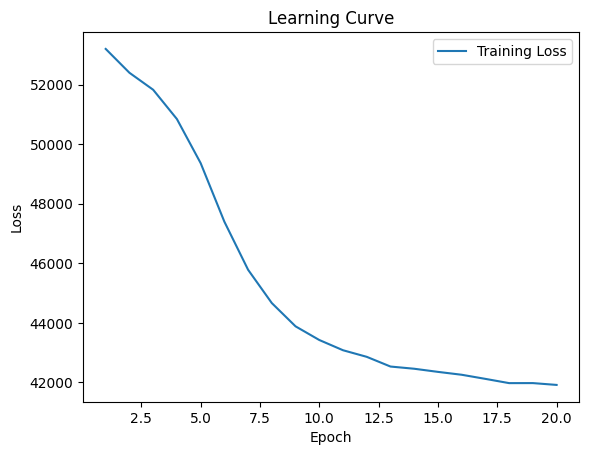

In [ ]:
# Train Basic CNN Model
train_model(basic_cnn, data_loader, epochs=20, lr=0.001, model_name = 'basic_cnn')

In [ ]:
from google.colab import files

# Download the saved models
files.download('basic_cnn.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch 1/10: 100%|██████████| 2004/2004 [13:47<00:00,  2.42batch/s, loss=5.37e+4]

Epoch 1, Loss: 53700.610795986155



Epoch 2/10: 100%|██████████| 2004/2004 [13:47<00:00,  2.42batch/s, loss=5.31e+4]

Epoch 2, Loss: 53064.13200552021



Epoch 3/10: 100%|██████████| 2004/2004 [13:46<00:00,  2.42batch/s, loss=5.21e+4]

Epoch 3, Loss: 52084.26805081244



Epoch 4/10: 100%|██████████| 2004/2004 [13:48<00:00,  2.42batch/s, loss=5.14e+4]

Epoch 4, Loss: 51352.638766412485



Epoch 5/10: 100%|██████████| 2004/2004 [13:46<00:00,  2.43batch/s, loss=5.09e+4]

Epoch 5, Loss: 50896.206127783495



Epoch 6/10: 100%|██████████| 2004/2004 [13:45<00:00,  2.43batch/s, loss=5.04e+4]

Epoch 6, Loss: 50424.822979041914



Epoch 7/10: 100%|██████████| 2004/2004 [13:46<00:00,  2.42batch/s, loss=5e+4]

Epoch 7, Loss: 50041.455852942556



Epoch 8/10: 100%|██████████| 2004/2004 [13:44<00:00,  2.43batch/s, loss=4.96e+4]

Epoch 8, Loss: 49631.90794582709



Epoch 9/10: 100%|██████████| 2004/2004 [13:44<00:00,  2.43batch/s, loss=4.94e+4]

Epoch 9, Loss: 49380.654819267715



Epoch 10/10: 100%|██████████| 2004/2004 [13:46<00:00,  2.43batch/s, loss=4.9e+4]


Epoch 10, Loss: 48963.97097309287


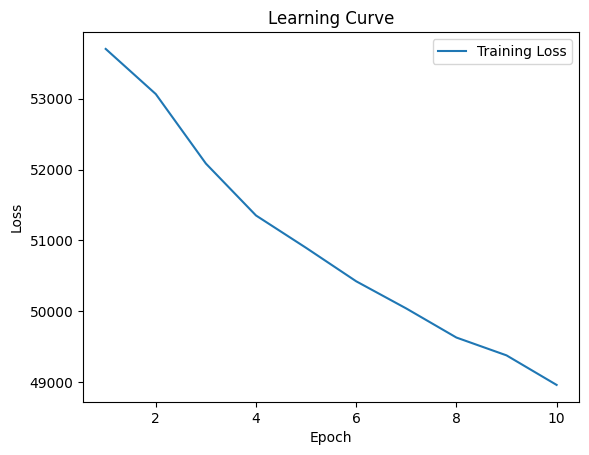

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
# Train HRNet Model
train_model(hrnet_model, data_loader, epochs=10, lr=0.001, model_name = 'hrnet')
files.download('hrnet.pth')

## Load Models

In [ ]:
# Define your models as before
basic_cnn = BasicCNN().cuda()
hrnet_model = HRNetPoseEstimation().cuda()

# Load the state dictionaries
basic_cnn.load_state_dict(torch.load('basic_cnn.pth'))
hrnet_model.load_state_dict(torch.load('hrnet.pth'))

# Set models to evaluation mode
basic_cnn.eval()
hrnet_model.eval()

HRNetPoseEstimation(
  (hrnet): HighResolutionNet(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act2): ReLU(inplace=True)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop_block): Identity()
        (act2): ReLU(inplace=True)
        

# Train CRF Model with features from the Basic CNN Model

In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
from PIL import Image
import os
import random
import matplotlib.pyplot as plt
import cv2
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Taken care of COCO dataset above

# Custom collate function
def custom_collate(batch):
    images = [item[0] for item in batch]
    keypoints = [item[1] for item in batch]

    images = torch.stack(images, dim=0)

    max_keypoints = max(kp.shape[0] for kp in keypoints)

    padded_keypoints = []
    masks = []
    for kp in keypoints:
        mask = torch.ones(kp.shape[0], dtype=torch.bool)
        padding = torch.zeros((max_keypoints - kp.shape[0], 3))
        mask_padding = torch.zeros((max_keypoints - kp.shape[0]), dtype=torch.bool)

        padded_kp = torch.cat([kp, padding], dim=0)
        mask = torch.cat([mask, mask_padding], dim=0)

        padded_keypoints.append(padded_kp)
        masks.append(mask)

    padded_keypoints = torch.stack(padded_keypoints, dim=0)
    masks = torch.stack(masks, dim=0)
    return images, padded_keypoints, masks

# COCO Dataset class
class COCODataset(Dataset):
    def __init__(self, root, annFile, transform=None):
        self.root = root
        self.coco = COCO(annFile)
        self.transform = transform
        self.catIds = self.coco.getCatIds(catNms=['person'])
        self.imgIds = self.coco.getImgIds(catIds=self.catIds)

    def __len__(self):
        return len(self.imgIds)

    def __getitem__(self, idx):
        img_id = self.imgIds[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']

        img = Image.open(os.path.join(self.root, path)).convert('RGB')
        if self.transform:
            img = self.transform(img)

        ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=self.catIds, iscrowd=False)
        anns = self.coco.loadAnns(ann_ids)

        keypoints = []
        for ann in anns:
            keypoints.extend(ann['keypoints'])

        keypoints = torch.tensor(keypoints).view(-1, 3)

        return img, keypoints

# Transformations and DataLoader
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

data_dir = './coco/train2017'
ann_file = './coco/annotations/person_keypoints_train2017.json'
coco_dataset = COCODataset(root=data_dir, annFile=ann_file, transform=transform)
data_loader = DataLoader(coco_dataset, batch_size=32, shuffle=True, num_workers=4, collate_fn=custom_collate)

# Define and initialize the model components (CNN, CRF, and combined model)

class BasicCNN(nn.Module):
    def __init__(self):
        super(BasicCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(64 * 64 * 64, 1024)
        self.fc2 = nn.Linear(1024, 17 * 256)  # Adjusted output dimensions

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x.view(-1, 17, 256)  # Adjusted output shape


class CRF(nn.Module):
    def __init__(self, num_keypoints, num_features):
        super(CRF, self).__init__()
        self.num_keypoints = num_keypoints
        self.num_features = num_features
        self.transitions = nn.Parameter(torch.randn(num_keypoints, num_keypoints))
        self.start_transitions = nn.Parameter(torch.randn(num_keypoints))
        self.end_transitions = nn.Parameter(torch.randn(num_keypoints))
        self.feature_weights = nn.Parameter(torch.randn(num_features, num_keypoints))

    def forward(self, features):
        batch_size, seq_len, num_features = features.size()
        features = features.view(batch_size * seq_len, num_features)
        emissions = torch.matmul(features, self.feature_weights)
        emissions = emissions.view(batch_size, seq_len, self.num_keypoints)
        scores = self.start_transitions + emissions[:, 0]
        for t in range(1, seq_len):
            transition_scores = self.transitions.unsqueeze(0).expand(batch_size, -1, -1)
            emission_scores = emissions[:, t].unsqueeze(2).expand(-1, -1, self.num_keypoints)
            scores_t = scores.unsqueeze(2).expand(-1, -1, self.num_keypoints) + transition_scores + emission_scores
            scores = torch.logsumexp(scores_t, dim=1)
        scores = scores + self.end_transitions
        log_likelihood = torch.logsumexp(scores, dim=1)
        return log_likelihood

    def predict(self, features):
        batch_size, seq_len, num_features = features.size()
        features = features.view(batch_size * seq_len, num_features)
        emissions = torch.matmul(features, self.feature_weights)
        emissions = emissions.view(batch_size, seq_len, self.num_keypoints)
        scores = self.start_transitions + emissions[:, 0]
        backpointers = []
        for t in range(1, seq_len):
            transition_scores = self.transitions.unsqueeze(0).expand(batch_size, -1, -1)
            emission_scores = emissions[:, t].unsqueeze(2).expand(-1, -1, self.num_keypoints)
            scores_t = scores.unsqueeze(2).expand(-1, -1, self.num_keypoints) + transition_scores + emission_scores
            scores, best_paths = torch.max(scores_t, dim=1)
            backpointers.append(best_paths)
        scores = scores + self.end_transitions
        best_paths = []
        for b in range(batch_size):
            best_score, best_last_tag = torch.max(scores[b], dim=0)
            best_path = [best_last_tag.item()]
            for bp in reversed(backpointers):
                best_last_tag = bp[b, best_last_tag].item()
                best_path.insert(0, best_last_tag)
            best_paths.append(best_path)
        return best_paths

# Hinge loss function for SSVM
def hinge_loss(features, keypoints, crf):
    batch_size, seq_len, num_features = features.size()
    keypoints = keypoints.view(batch_size, seq_len, -1)[:,:,0].long()

    # Compute scores
    scores = crf.start_transitions + features[:, 0].matmul(crf.feature_weights)
    for t in range(1, seq_len):
        transition_scores = crf.transitions.unsqueeze(0).expand(batch_size, -1, -1)
        emission_scores = features[:, t].matmul(crf.feature_weights)
        scores_t = scores.unsqueeze(2).expand(-1, -1, crf.num_keypoints) + transition_scores + emission_scores.unsqueeze(1)
        scores = torch.max(scores_t, dim=1)[0]
    scores = scores + crf.end_transitions

    # Compute hinge loss
    correct_scores = torch.gather(scores, 1, keypoints.unsqueeze(1)).squeeze(1)
    hinge_loss = torch.clamp(1 - correct_scores + scores.max(dim=1)[0], min=0).mean()
    return hinge_loss

class PoseEstimationModel(nn.Module):
    def __init__(self, cnn, crf):
        super(PoseEstimationModel, self).__init__()
        self.cnn = cnn
        self.crf = crf

    def forward(self, images):
        features = self.cnn(images)
        log_likelihood = self.crf(features)
        return log_likelihood

    def predict(self, images):
        features = self.cnn(images)
        keypoint_predictions = self.crf.predict(features)
        return keypoint_predictions


loading annotations into memory...
Done (t=12.89s)
creating index...
index created!


In [ ]:
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
            torch.nn.init.constant_(m.bias, 0)

cnn.apply(init_weights)
crf.apply(init_weights)

CRF()

## CNN+CRF Training

In [ ]:
# TRAINING

num_keypoints = 17
num_features = 256  # Updated number of features

cnn = BasicCNN().to(device)
crf = CRF(num_keypoints=num_keypoints, num_features=num_features).to(device)
model = PoseEstimationModel(cnn, crf).to(device)

# Optimizer and training setup
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.NLLLoss()

from tqdm import tqdm

# Training loop with tqdm for progress bar
num_epochs = 15
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc=f"Epoch {epoch + 1}/{num_epochs}")
    for images, keypoints, masks in progress_bar:
        images = images.to(device)
        keypoints = keypoints.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        log_likelihood = model(images)
        loss = -log_likelihood.mean()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix(loss=total_loss / len(data_loader))
    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {total_loss / len(data_loader)}")

Epoch 1/15: 100%|██████████| 2004/2004 [09:28<00:00,  3.52it/s, loss=-1.99e+13]


Epoch 1/15, Loss: -19926866626985.223


Epoch 2/15: 100%|██████████| 2004/2004 [09:24<00:00,  3.55it/s, loss=-5.48e+14]


Epoch 2/15, Loss: -547670714810760.44


Epoch 3/15: 100%|██████████| 2004/2004 [09:26<00:00,  3.54it/s, loss=-3.19e+15]


Epoch 3/15, Loss: -3189302282014188.5


Epoch 4/15: 100%|██████████| 2004/2004 [09:36<00:00,  3.48it/s, loss=-1.04e+16]


Epoch 4/15, Loss: -1.0402986137572694e+16


Epoch 5/15: 100%|██████████| 2004/2004 [09:39<00:00,  3.46it/s, loss=-2.55e+16]


Epoch 5/15, Loss: -2.552217426836778e+16


Epoch 6/15: 100%|██████████| 2004/2004 [09:27<00:00,  3.53it/s, loss=-5.29e+16]


Epoch 6/15, Loss: -5.289718165536978e+16


Epoch 7/15: 100%|██████████| 2004/2004 [09:31<00:00,  3.51it/s, loss=-9.8e+16]


Epoch 7/15, Loss: -9.796403602818528e+16


Epoch 8/15: 100%|██████████| 2004/2004 [09:26<00:00,  3.53it/s, loss=-1.67e+17]


Epoch 8/15, Loss: -1.6745266331093418e+17


Epoch 9/15: 100%|██████████| 2004/2004 [09:31<00:00,  3.50it/s, loss=-2.69e+17]


Epoch 9/15, Loss: -2.693075118778301e+17


Epoch 10/15: 100%|██████████| 2004/2004 [09:32<00:00,  3.50it/s, loss=-4.13e+17]


Epoch 10/15, Loss: -4.129723846431778e+17


Epoch 11/15: 100%|██████████| 2004/2004 [09:36<00:00,  3.48it/s, loss=-6.09e+17]


Epoch 11/15, Loss: -6.092382430824911e+17


Epoch 12/15: 100%|██████████| 2004/2004 [09:33<00:00,  3.50it/s, loss=-8.71e+17]


Epoch 12/15, Loss: -8.707748087618501e+17


Epoch 13/15: 100%|██████████| 2004/2004 [09:38<00:00,  3.46it/s, loss=-1.21e+18]


Epoch 13/15, Loss: -1.2117930412283249e+18


Epoch 14/15: 100%|██████████| 2004/2004 [09:35<00:00,  3.48it/s, loss=-1.65e+18]


Epoch 14/15, Loss: -1.648072120820533e+18


Epoch 15/15: 100%|██████████| 2004/2004 [09:32<00:00,  3.50it/s, loss=-2.2e+18]

Epoch 15/15, Loss: -2.1973975507295613e+18


In [ ]:
# Save the model state dictionary
torch.save(model.state_dict(), 'cnn-crf.pth')

from google.colab import files
# Download the saved models
files.download('cnn-crf.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# CNN+CRF Model Evaluation and Visualization of Prediction

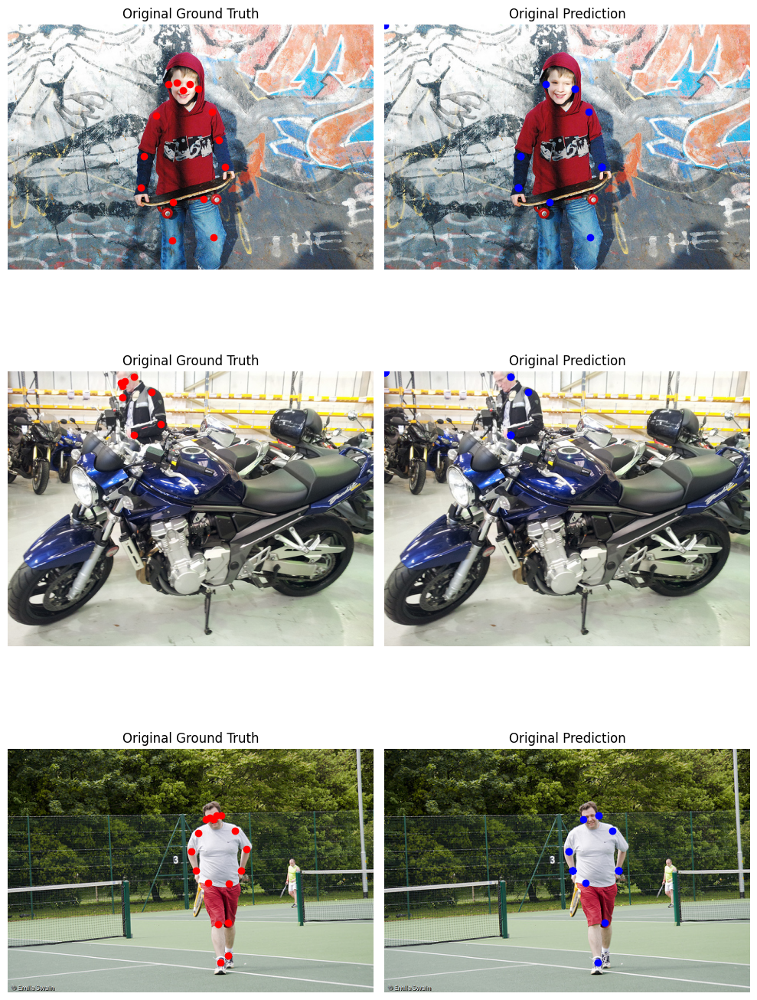

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to decode CRF output predictions into coordinates
def decode_predictions(pred, keypoints, num_keypoints=17):
    coords = []
    for idx in pred:
        if idx < keypoints.size(0):
            coords.append(keypoints[idx][:2].tolist())
        else:
            coords.append([0, 0])  # Default value for missing keypoints
    return np.array(coords)

# Function to visualize original predictions
def visualize_original_predictions(model, dataset, num_images=3):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    images, targets, predictions = [], [], []

    for idx in indices:
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        images.append(img)
        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for i in range(num_images):
        img = images[i]
        img_np = np.array(img)

        original_targets = targets[i].clone().float()
        original_predictions = predictions[i].clone().float()

        axes[i][0].imshow(img_np)
        axes[i][0].set_title("Original Ground Truth")
        axes[i][0].axis('off')
        for j in range(original_targets.size(0)):
            if original_targets[j, 2] > 0:  # If the keypoint is visible
                axes[i][0].plot(original_targets[j, 0], original_targets[j, 1], 'ro')

        axes[i][1].imshow(img_np)
        axes[i][1].set_title("Original Prediction")
        axes[i][1].axis('off')
        for j in range(original_predictions.size(0)):
            axes[i][1].plot(original_predictions[j, 0], original_predictions[j, 1], 'bo')

    plt.tight_layout()
    plt.show()

# Visualize original predictions on 3 random images
cnn = BasicCNN().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(cnn, crf).to(device)

visualize_original_predictions(model, coco_dataset, num_images=3)


### Skeleton Connections

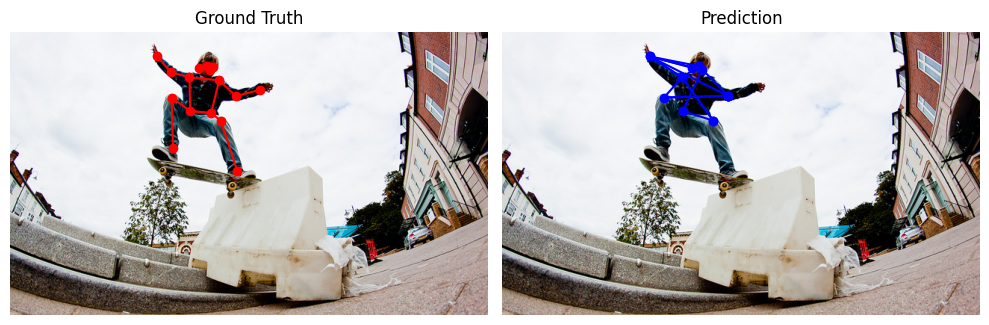

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the skeleton connections (COCO keypoints)
skeleton = [
    (1, 2), (1, 3), (2, 4), (3, 5),  # Head
    (6, 7), (6, 8), (7, 9), (8, 10), (9, 11),  # Arms
    (12, 13), (12, 14), (13, 15), (14, 16), (15, 17),  # Legs
    (6, 12), (7, 13),  # Torso
    (12, 13)  # Hips
]

# Function to decode CRF output predictions into coordinates with visibility flag
def decode_predictions(pred, keypoints, num_keypoints=17):
    coords = []
    for idx in pred:
        if idx < keypoints.size(0):
            coords.append([keypoints[idx][0], keypoints[idx][1], keypoints[idx][2]])
        else:
            coords.append([0, 0, 0])  # Default value for missing keypoints
    return np.array(coords)

# Function to draw skeleton connections
def draw_skeleton(ax, keypoints, color='r'):
    for joint1, joint2 in skeleton:
        if keypoints[joint1-1, 2] > 0 and keypoints[joint2-1, 2] > 0 and \
           not (keypoints[joint1-1, 0] == 0 and keypoints[joint1-1, 1] == 0) and \
           not (keypoints[joint2-1, 0] == 0 and keypoints[joint2-1, 1] == 0):
            ax.plot([keypoints[joint1-1, 0], keypoints[joint2-1, 0]], [keypoints[joint1-1, 1], keypoints[joint2-1, 1]], color=color)

# Function to visualize original predictions with skeleton connections
def visualize_original_predictions(model, dataset, num_images=3):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    images, targets, predictions = [], [], []

    for idx in indices:
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        images.append(img)
        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates with visibility
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for i in range(num_images):
        img = images[i]
        img_np = np.array(img)

        original_targets = targets[i].clone().float()
        original_predictions = predictions[i].clone().float()

        axes[i][0].imshow(img_np)
        axes[i][0].set_title("Ground Truth")
        axes[i][0].axis('off')
        for j in range(original_targets.size(0)):
            if original_targets[j, 2] > 0:  # If the keypoint is visible
                axes[i][0].plot(original_targets[j, 0], original_targets[j, 1], 'ro')
        draw_skeleton(axes[i][0], original_targets, color='r')

        axes[i][1].imshow(img_np)
        axes[i][1].set_title("Prediction")
        axes[i][1].axis('off')
        for j in range(original_predictions.size(0)):
            if original_predictions[j, 0] != 0 and original_predictions[j, 1] != 0:  # Avoid plotting at (0, 0)
                axes[i][1].plot(original_predictions[j, 0], original_predictions[j, 1], 'bo')
        draw_skeleton(axes[i][1], original_predictions, color='b')

    plt.tight_layout()
    plt.show()

# Visualize original predictions with skeleton connections on a random image
cnn = BasicCNN().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(cnn, crf).to(device)

visualize_original_predictions(model, coco_dataset, num_images=1)

### % of Correct Keypoints

In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

def calculate_pck(predictions, targets, threshold=0.2):
    """
    Calculate the Percentage of Correct Keypoints (PCK).

    Parameters:
    - predictions: list of predicted keypoints
    - targets: list of ground truth keypoints
    - threshold: the normalized distance threshold to consider a keypoint as correctly predicted

    Returns:
    - pck: the PCK value
    """
    correct_keypoints = 0
    total_keypoints = 0

    for pred, target in zip(predictions, targets):
        # Calculate the bounding box size (diagonal length) to normalize the distance
        bbox_size = np.sqrt((target[:, 0].max() - target[:, 0].min()) ** 2 + (target[:, 1].max() - target[:, 1].min()) ** 2)

        # Calculate the distances between predicted and ground truth keypoints
        distances = cdist(pred[:, :2], target[:, :2], metric='euclidean')

        for i in range(len(pred)):
            if target[i, 2] > 0:  # Only consider visible keypoints in the ground truth
                total_keypoints += 1
                if distances[i, i] <= threshold * bbox_size:
                    correct_keypoints += 1

    pck = correct_keypoints / total_keypoints if total_keypoints > 0 else 0
    return pck

def evaluate_pck(model, dataset, threshold=0.2):
    model.eval()
    predictions = []
    targets = []

    for idx in range(len(dataset)):
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates with visibility
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    pck = calculate_pck(predictions, targets, threshold)
    print(f"PCK: {pck:.2f}")

# Evaluate PCK on the entire dataset
cnn = BasicCNN().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(cnn, crf).to(device)

evaluate_pck(model, coco_dataset, threshold=0.2)

# Train CRF Model with features from the HRNet Model

In [3]:
!pip install timm -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 60.3 MB/s eta 0:00:00


In [4]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
from PIL import Image
import os
import random
import timm
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Custom collate function
def custom_collate(batch):
    images = [item[0] for item in batch]
    keypoints = [item[1] for item in batch]

    images = torch.stack(images, dim=0)

    max_keypoints = max(kp.shape[0] for kp in keypoints)

    padded_keypoints = []
    masks = []
    for kp in keypoints:
        mask = torch.ones(kp.shape[0], dtype=torch.bool)
        padding = torch.zeros((max_keypoints - kp.shape[0], 3))
        mask_padding = torch.zeros((max_keypoints - kp.shape[0]), dtype=torch.bool)

        padded_kp = torch.cat([kp, padding], dim=0)
        mask = torch.cat([mask, mask_padding], dim=0)

        padded_keypoints.append(padded_kp)
        masks.append(mask)

    padded_keypoints = torch.stack(padded_keypoints, dim=0)
    masks = torch.stack(masks, dim=0)
    return images, padded_keypoints, masks

# COCO Dataset class
class COCODataset(Dataset):
    def __init__(self, root, annFile, transform=None):
        self.root = root
        self.coco = COCO(annFile)
        self.transform = transform
        self.catIds = self.coco.getCatIds(catNms=['person'])
        self.imgIds = self.coco.getImgIds(catIds=self.catIds)

    def __len__(self):
        return len(self.imgIds)

    def __getitem__(self, idx):
        img_id = self.imgIds[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']

        img = Image.open(os.path.join(self.root, path)).convert('RGB')
        if self.transform:
            img = self.transform(img)

        ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=self.catIds, iscrowd=False)
        anns = self.coco.loadAnns(ann_ids)

        keypoints = []
        for ann in anns:
            keypoints.extend(ann['keypoints'])

        keypoints = torch.tensor(keypoints).view(-1, 3)

        return img, keypoints

# Transformations and DataLoader
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

data_dir = './coco/train2017'
ann_file = './coco/annotations/person_keypoints_train2017.json'
coco_dataset = COCODataset(root=data_dir, annFile=ann_file, transform=transform)
data_loader = DataLoader(coco_dataset, batch_size=32, shuffle=True, num_workers=4, collate_fn=custom_collate)

# Define and initialize the model components (HRNet, CRF, and combined model)

class HRNet(nn.Module):
    def __init__(self):
        super(HRNet, self).__init__()
        self.hrnet = timm.create_model('hrnet_w32', pretrained=True, in_chans=3)
        self.fc = nn.Linear(2048, 17 * 256)  # Adjusted output dimensions

    def forward(self, x):
        x = self.hrnet.forward_features(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x.view(-1, 17, 256)  # Adjusted output shape

class CRF(nn.Module):
    def __init__(self, num_keypoints, num_features):
        super(CRF, self).__init__()
        self.num_keypoints = num_keypoints
        self.num_features = num_features
        self.transitions = nn.Parameter(torch.randn(num_keypoints, num_keypoints))
        self.start_transitions = nn.Parameter(torch.randn(num_keypoints))
        self.end_transitions = nn.Parameter(torch.randn(num_keypoints))
        self.feature_weights = nn.Parameter(torch.randn(num_features, num_keypoints))

    def forward(self, features):
        batch_size, seq_len, num_features = features.size()
        features = features.view(batch_size * seq_len, num_features)
        emissions = torch.matmul(features, self.feature_weights)
        emissions = emissions.view(batch_size, seq_len, self.num_keypoints)
        scores = self.start_transitions + emissions[:, 0]
        for t in range(1, seq_len):
            transition_scores = self.transitions.unsqueeze(0).expand(batch_size, -1, -1)
            emission_scores = emissions[:, t].unsqueeze(2).expand(-1, -1, self.num_keypoints)
            scores_t = scores.unsqueeze(2).expand(-1, -1, self.num_keypoints) + transition_scores + emission_scores
            scores = torch.logsumexp(scores_t, dim=1)
        scores = scores + self.end_transitions
        log_likelihood = torch.logsumexp(scores, dim=1)
        return log_likelihood

    def predict(self, features):
        batch_size, seq_len, num_features = features.size()
        features = features.view(batch_size * seq_len, num_features)
        emissions = torch.matmul(features, self.feature_weights)
        emissions = emissions.view(batch_size, seq_len, self.num_keypoints)
        scores = self.start_transitions + emissions[:, 0]
        backpointers = []
        for t in range(1, seq_len):
            transition_scores = self.transitions.unsqueeze(0).expand(batch_size, -1, -1)
            emission_scores = emissions[:, t].unsqueeze(2).expand(-1, -1, self.num_keypoints)
            scores_t = scores.unsqueeze(2).expand(-1, -1, self.num_keypoints) + transition_scores + emission_scores
            scores, best_paths = torch.max(scores_t, dim=1)
            backpointers.append(best_paths)
        scores = scores + self.end_transitions
        best_paths = []
        for b in range(batch_size):
            best_score, best_last_tag = torch.max(scores[b], dim=0)
            best_path = [best_last_tag.item()]
            for bp in reversed(backpointers):
                best_last_tag = bp[b, best_last_tag].item()
                best_path.insert(0, best_last_tag)
            best_paths.append(best_path)
        return best_paths

# Hinge loss function for SSVM
def hinge_loss(features, keypoints, crf):
    batch_size, seq_len, num_features = features.size()
    keypoints = keypoints.view(batch_size, seq_len, -1)[:,:,0].long()

    # Compute scores
    scores = crf.start_transitions + features[:, 0].matmul(crf.feature_weights)
    for t in range(1, seq_len):
        transition_scores = crf.transitions.unsqueeze(0).expand(batch_size, -1, -1)
        emission_scores = features[:, t].matmul(crf.feature_weights)
        scores_t = scores.unsqueeze(2).expand(-1, -1, crf.num_keypoints) + transition_scores + emission_scores.unsqueeze(1)
        scores = torch.max(scores_t, dim=1)[0]
    scores = scores + crf.end_transitions

    # Compute hinge loss
    correct_scores = torch.gather(scores, 1, keypoints.unsqueeze(1)).squeeze(1)
    hinge_loss = torch.clamp(1 - correct_scores + scores.max(dim=1)[0], min=0).mean()
    return hinge_loss

class PoseEstimationModel(nn.Module):
    def __init__(self, hrnet, crf):
        super(PoseEstimationModel, self).__init__()
        self.hrnet = hrnet
        self.crf = crf

    def forward(self, images):
        features = self.hrnet(images)
        log_likelihood = self.crf(features)
        return log_likelihood

    def predict(self, images):
        features = self.hrnet(images)
        keypoint_predictions = self.crf.predict(features)
        return keypoint_predictions

loading annotations into memory...
Done (t=16.96s)
creating index...
index created!


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


## HRNet+CRF Training

In [ ]:
# TRAINING

num_keypoints = 17
num_features = 256  # Updated number of features

hrnet = HRNet().to(device)
crf = CRF(num_keypoints=num_keypoints, num_features=num_features).to(device)
model = PoseEstimationModel(hrnet, crf).to(device)

# Optimizer and training setup
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.NLLLoss()

from tqdm import tqdm

# Training loop with tqdm for progress bar
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc=f"Epoch {epoch + 1}/{num_epochs}")
    for images, keypoints, masks in progress_bar:
        images = images.to(device)
        keypoints = keypoints.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        log_likelihood = model(images)
        loss = -log_likelihood.mean()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix(loss=total_loss / len(data_loader))
    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {total_loss / len(data_loader)}")

# Save the model state dictionary
torch.save(model.state_dict(), 'hrnet-crf.pth')

from google.colab import files
# Download the saved models
files.download('hrnet-crf.pth')

## HRNet+CRF Model Evaluation and Visualization of Prediction

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to decode CRF output predictions into coordinates
def decode_predictions(pred, keypoints, num_keypoints=17):
    coords = []
    for idx in pred:
        if idx < keypoints.size(0):
            coords.append(keypoints[idx][:2].tolist())
        else:
            coords.append([0, 0])  # Default value for missing keypoints
    return np.array(coords)

# Function to visualize original predictions
def visualize_original_predictions(model, dataset, num_images=3):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    images, targets, predictions = [], [], []

    for idx in indices:
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        images.append(img)
        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for i in range(num_images):
        img = images[i]
        img_np = np.array(img)

        original_targets = targets[i].clone().float()
        original_predictions = predictions[i].clone().float()

        axes[i][0].imshow(img_np)
        axes[i][0].set_title("Original Ground Truth")
        axes[i][0].axis('off')
        for j in range(original_targets.size(0)):
            if original_targets[j, 2] > 0:  # If the keypoint is visible
                axes[i][0].plot(original_targets[j, 0], original_targets[j, 1], 'ro')

        axes[i][1].imshow(img_np)
        axes[i][1].set_title("Original Prediction")
        axes[i][1].axis('off')
        for j in range(original_predictions.size(0)):
            axes[i][1].plot(original_predictions[j, 0], original_predictions[j, 1], 'bo')

    plt.tight_layout()
    plt.show()

hrnet = HRNet().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(hrnet, crf).to(device)

# Visualize original predictions on 3 random images
visualize_original_predictions(model, coco_dataset, num_images=3)

### Skeleton Connections

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the skeleton connections (COCO keypoints)
skeleton = [
    (1, 2), (1, 3), (2, 4), (3, 5),  # Head
    (6, 7), (6, 8), (7, 9), (8, 10), (9, 11),  # Arms
    (12, 13), (12, 14), (13, 15), (14, 16), (15, 17),  # Legs
    (6, 12), (7, 13),  # Torso
    (12, 13)  # Hips
]

# Function to decode CRF output predictions into coordinates with visibility flag
def decode_predictions(pred, keypoints, num_keypoints=17):
    coords = []
    for idx in pred:
        if idx < keypoints.size(0):
            coords.append([keypoints[idx][0], keypoints[idx][1], keypoints[idx][2]])
        else:
            coords.append([0, 0, 0])  # Default value for missing keypoints
    return np.array(coords)

# Function to draw skeleton connections
def draw_skeleton(ax, keypoints, color='r'):
    for joint1, joint2 in skeleton:
        if keypoints[joint1-1, 2] > 0 and keypoints[joint2-1, 2] > 0 and \
           not (keypoints[joint1-1, 0] == 0 and keypoints[joint1-1, 1] == 0) and \
           not (keypoints[joint2-1, 0] == 0 and keypoints[joint2-1, 1] == 0):
            ax.plot([keypoints[joint1-1, 0], keypoints[joint2-1, 0]], [keypoints[joint1-1, 1], keypoints[joint2-1, 1]], color=color)

# Function to visualize original predictions with skeleton connections
def visualize_original_predictions(model, dataset, num_images=3):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    images, targets, predictions = [], [], []

    for idx in indices:
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        images.append(img)
        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates with visibility
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for i in range(num_images):
        img = images[i]
        img_np = np.array(img)

        original_targets = targets[i].clone().float()
        original_predictions = predictions[i].clone().float()

        axes[i][0].imshow(img_np)
        axes[i][0].set_title("Ground Truth")
        axes[i][0].axis('off')
        for j in range(original_targets.size(0)):
            if original_targets[j, 2] > 0:  # If the keypoint is visible
                axes[i][0].plot(original_targets[j, 0], original_targets[j, 1], 'ro')
        draw_skeleton(axes[i][0], original_targets, color='r')

        axes[i][1].imshow(img_np)
        axes[i][1].set_title("Prediction")
        axes[i][1].axis('off')
        for j in range(original_predictions.size(0)):
            if original_predictions[j, 0] != 0 and original_predictions[j, 1] != 0:  # Avoid plotting at (0, 0)
                axes[i][1].plot(original_predictions[j, 0], original_predictions[j, 1], 'bo')
        draw_skeleton(axes[i][1], original_predictions, color='b')

    plt.tight_layout()
    plt.show()

# Define and initialize the HRNet+CRF model
class HRNet(nn.Module):
    def __init__(self):
        super(HRNet, self).__init__()
        self.hrnet = timm.create_model('hrnet_w32', pretrained=True, in_chans=3)
        self.fc = nn.Linear(2048, 17 * 256)  # Adjusted output dimensions

    def forward(self, x):
        x = self.hrnet.forward_features(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x.view(-1, 17, 256)  # Adjusted output shape

class PoseEstimationModel(nn.Module):
    def __init__(self, hrnet, crf):
        super(PoseEstimationModel, self).__init__()
        self.hrnet = hrnet
        self.crf = crf

    def forward(self, images):
        features = self.hrnet(images)
        log_likelihood = self.crf(features)
        return log_likelihood

    def predict(self, images):
        features = self.hrnet(images)
        keypoint_predictions = self.crf.predict(features)
        return keypoint_predictions

hrnet = HRNet().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(hrnet, crf).to(device)

# Visualize original predictions with skeleton connections on a random image
visualize_original_predictions(model, coco_dataset, num_images=1)

### % of Correct Keypoints

In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

def calculate_pck(predictions, targets, threshold=0.2):
    """
    Calculate the Percentage of Correct Keypoints (PCK).

    Parameters:
    - predictions: list of predicted keypoints
    - targets: list of ground truth keypoints
    - threshold: the normalized distance threshold to consider a keypoint as correctly predicted

    Returns:
    - pck: the PCK value
    """
    correct_keypoints = 0
    total_keypoints = 0

    for pred, target in zip(predictions, targets):
        # Calculate the bounding box size (diagonal length) to normalize the distance
        bbox_size = np.sqrt((target[:, 0].max() - target[:, 0].min()) ** 2 + (target[:, 1].max() - target[:, 1].min()) ** 2)

        # Calculate the distances between predicted and ground truth keypoints
        distances = cdist(pred[:, :2], target[:, :2], metric='euclidean')

        for i in range(len(pred)):
            if target[i, 2] > 0:  # Only consider visible keypoints in the ground truth
                total_keypoints += 1
                if distances[i, i] <= threshold * bbox_size:
                    correct_keypoints += 1

    pck = correct_keypoints / total_keypoints if total_keypoints > 0 else 0
    return pck

def evaluate_pck(model, dataset, threshold=0.2):
    model.eval()
    predictions = []
    targets = []

    for idx in range(len(dataset)):
        img_id = dataset.imgIds[idx]
        img_info = dataset.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(dataset.root, path)).convert('RGB')
        keypoints = []

        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, catIds=dataset.catIds, iscrowd=False)
        anns = dataset.coco.loadAnns(ann_ids)
        for ann in anns:
            keypoints.extend(ann['keypoints'])
        keypoints = torch.tensor(keypoints).view(-1, 3)

        targets.append(keypoints)

        with torch.no_grad():
            img_tensor = dataset.transform(img).unsqueeze(0).to(device)
            pred_indices = model.predict(img_tensor)[0]

            # Decode predictions to get (x, y) coordinates with visibility
            try:
                pred_coords = decode_predictions(pred_indices, keypoints)
                pred_coords = torch.tensor(pred_coords)
                predictions.append(pred_coords)
            except Exception as e:
                print(f"Error processing predictions: {e}")
                return

    pck = calculate_pck(predictions, targets, threshold)
    print(f"PCK: {pck:.2f}")

# Evaluate PCK on the entire dataset
cnn = BasicCNN().to(device)
crf = CRF(num_keypoints=17, num_features=256).to(device)
model = PoseEstimationModel(cnn, crf).to(device)

evaluate_pck(model, coco_dataset, threshold=0.2)